In [39]:
from keras import __version__
import numpy as np
from keras.models import model_from_json, Model, Sequential
from keras.layers import Dropout, Flatten, Dense, Activation
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import euclidean_distances
from keras import optimizers
from sklearn.model_selection import train_test_split
import keras
from tempfile import TemporaryFile
import csv
from sklearn.neighbors import KDTree, NearestNeighbors
import cv2
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
def load_model(weights_path, json_path):
    json_file = open('model_files/' + json_path, 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)

    # load weights into new model
    loaded_model.load_weights('model_files/' + weights_path)
    print("Loaded model from disk")
    return loaded_model

def get_clothing_vector_model(weights_path, json_path):
    loaded_model = load_model(weights_path, json_path)
    loaded_model.layers.pop() # Get rid of the classification layer
    last = loaded_model.layers[-1].output
    model = Model(loaded_model.input, last)
    return model

def image_preprocess(img_path):
    image = load_img(img_path, target_size=(299, 299))
    image = img_to_array(image)

    # our input image is now represented as a NumPy array of shape
    # (inputShape[0], inputShape[1], 3) however we need to expand the
    # dimension by making the shape (1, inputShape[0], inputShape[1], 3)
    # so we can pass it through thenetwork
    image = np.expand_dims(image, axis=0)

    # pre-process the image using the appropriate function based on the
    # model that has been loaded (i.e., mean subtraction, scaling, etc.)
    image = preprocess_input(image)
    return image

def get_classier_prediction(clothing_classifier, img_path):
    clothes_labels = ['dresses', 'handbags', 'hats', 'jackets', 'jeans', 
                      'jewelry', 'shorts', 'skirts', 'sunglasses', 'sweaters', 
                      'sweatshirts', 'womens-outerwear', 'womens-pants', 'womens-shoes', 'womens-tops']
    img = image_preprocess(img_path)
    preds = clothing_classifier.predict(img)[0]
    preds_labels = list(zip(clothes_labels, preds))
    preds_labels.sort(key=lambda p: p[1], reverse=True)
    return preds_labels

In [3]:
clothing_classifier_weights_path = 'inceptionv3_clothing_expanded_classifier.h5'
clothing_classifier_json_path = 'incep_filter_clothing_expanded_classifier.json'
clothing_classifier = load_model(clothing_classifier_weights_path, clothing_classifier_json_path)
clothing_classifier.summary()

Loaded model from disk
____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_4 (InputLayer)             (None, None, None, 3) 0                                            
____________________________________________________________________________________________________
conv2d_234 (Conv2D)              (None, None, None, 32 864         input_4[0][0]                    
____________________________________________________________________________________________________
batch_normalization_233 (BatchNo (None, None, None, 32 96          conv2d_234[0][0]                 
____________________________________________________________________________________________________
activation_233 (Activation)      (None, None, None, 32 0           batch_normalization_233[0][0]    
____________________________________________________________________

____________________________________________________________________________________________________
activation_320 (Activation)      (None, None, None, 38 0           batch_normalization_320[0][0]    
____________________________________________________________________________________________________
activation_321 (Activation)      (None, None, None, 38 0           batch_normalization_321[0][0]    
____________________________________________________________________________________________________
activation_324 (Activation)      (None, None, None, 38 0           batch_normalization_324[0][0]    
____________________________________________________________________________________________________
activation_325 (Activation)      (None, None, None, 38 0           batch_normalization_325[0][0]    
____________________________________________________________________________________________________
batch_normalization_326 (BatchNo (None, None, None, 19 576         conv2d_327[0][0]        

In [4]:
jeans_img_path = 'data-all/validation/jeans/482888849.jpg'
dress_img_path = 'data-all/validation/dresses/535993294.jpg'
jackets_img_path = 'data-all/validation/jackets/614521319.jpg'
jackets_img_path2 = 'data-all/validation/jackets/614763686.jpg'
sunglasses_img_path = 'data-all/validation/sunglasses/655241570.jpg'
dog_img_path = 'data-pets/train/dogs/dog.0.jpg'
get_classier_prediction(clothing_classifier, jeans_img_path)

[('jeans', 0.9994086),
 ('womens-pants', 0.00057119632),
 ('skirts', 9.8395294e-06),
 ('shorts', 5.155051e-06),
 ('womens-shoes', 1.597728e-06),
 ('dresses', 1.3391239e-06),
 ('sunglasses', 1.1239276e-06),
 ('handbags', 4.7018429e-07),
 ('womens-tops', 2.4409781e-07),
 ('jackets', 1.8252813e-07),
 ('sweaters', 1.2994238e-07),
 ('womens-outerwear', 1.1318308e-07),
 ('sweatshirts', 6.9145216e-08),
 ('jewelry', 2.7152748e-08),
 ('hats', 1.3843214e-08)]

In [5]:
classifier_vector_model = get_clothing_vector_model(clothing_classifier_weights_path, clothing_classifier_json_path)
img_jacket = image_preprocess(jackets_img_path)
img_jacket2 = image_preprocess(jackets_img_path2)
img_jeans = image_preprocess(jeans_img_path)
img_dress = image_preprocess(dress_img_path)
img_dog = image_preprocess(dog_img_path)

jacket_feat = classifier_vector_model.predict(img_jacket)
jacket_feat2 = classifier_vector_model.predict(img_jacket2)
jeans_feat = classifier_vector_model.predict(img_jeans)
dress_feat = classifier_vector_model.predict(img_dress)
dog_feat = classifier_vector_model.predict(img_dog)

jacket_feat

Loaded model from disk


array([[ 0.4811013 ,  1.57449019,  0.03476684, ...,  1.22023487,
         0.35871762,  0.71462518]], dtype=float32)

In [6]:
# compare cosine similarities
print('2 jackets: ', cosine_similarity(jacket_feat, jacket_feat2))
print('jeans and dress: ', cosine_similarity(jeans_feat, dress_feat))
print('jeans and dog: ', cosine_similarity(jeans_feat, dog_feat))

2 jackets:  [[ 0.97938693]]
jeans and dress:  [[ 0.97675443]]
jeans and dog:  [[ 0.98362172]]


In [7]:
jacket_feat.shape # (1, 1024)

(1, 1024)

## Skipgrams Model

In [8]:
def save_product_features(model, product_file, img_dir, output_file):
    products = []
    print('Reading file ', product_file)
    with open(product_file, 'r') as f:
        for i, line in enumerate(f.readlines()[:]):
            if i % 50 == 0:
                print('Processing product ', i)
            try:
                l = line.split('\t')
                product_id = l[0]
                product_img_path = img_dir + product_id + '.jpg' 
                product_img = image_preprocess(product_img_path)
                product_feat = model.predict(product_img)
    
                products.append([product_id] + product_feat[0].tolist())
            except Exception as e:
                print(e)
                
    print('Saving products to ', output_file)
    with open(output_file, 'w') as f:
        writer = csv.writer(f, delimiter='\t')
        for p in products:
            writer.writerow(p)
            f.flush()
    return products

def make_product_X_y(product_to_features, product1_id, product2_id, product3_id):
    product1_feat = product_to_features[product1_id]
    product2_feat = product_to_features[product2_id]
    product3_feat = product_to_features[product3_id]

    merged_feat = np.concatenate((product1_feat, product2_feat), axis=1)
    return merged_feat, product3_feat
    
def make_product_permutation_generator(outfit_permutations_file, product_to_features, batch_size):
    while True:
        with open(outfit_permutations_file, 'r') as f:
            curr_batch_X = []
            curr_batch_y = []
            for line in f:
                if len(curr_batch_X) == batch_size:
                    curr_batch_X = []
                    curr_batch_y = []
                    
                l = line.split()
                product1_id = l[2]
                product2_id = l[5]
                product3_id = l[8]
                merged_feat, y_feat = make_product_X_y(product_to_features, product1_id, product2_id, 
                                                       product3_id)
                curr_batch_X.append(merged_feat)
                curr_batch_y.append(y_feat)
                if len(curr_batch_X) == batch_size:
                    yield (np.array(curr_batch_X), np.array(curr_batch_y))


def get_product_to_features(product_feats_file):
    product_to_feats = {}
    with open(product_feats_file, 'r') as tsvfile:
        tsvreader = csv.reader(tsvfile, delimiter='\t')
        for row in tsvreader:
            product_id = row[0]
            feats = np.array([[float(n) for n in row[1:]]])
            product_to_feats[product_id] = feats
    return product_to_feats

In [11]:
# Run one time to save product weights
# save_product_features(classifier_vector_model, 'data-outfits/outfit_products_small.tsv', 
#                       'data-outfits/images_small/', 'data-outfits/outfit_product_features_small.tsv')

Reading file  data-outfits/outfit_products_small.tsv
Processing product  0
Processing product  50
Processing product  100
Processing product  150
Processing product  200
Processing product  250
Processing product  300
Processing product  350
Processing product  400
Processing product  450
Processing product  500
Processing product  550
Processing product  600
Processing product  650
Processing product  700
Processing product  750
Processing product  800
Processing product  850
Processing product  900
Processing product  950
Processing product  1000
Processing product  1050
Processing product  1100
Processing product  1150
Processing product  1200
Processing product  1250
Processing product  1300
Processing product  1350
Processing product  1400
Processing product  1450
Processing product  1500
Processing product  1550
Processing product  1600
Processing product  1650
Processing product  1700
Processing product  1750
Processing product  1800
Processing product  1850
Processing product  

Processing product  16100
Processing product  16150
Processing product  16200
Processing product  16250
Processing product  16300
Processing product  16350
Processing product  16400
Processing product  16450
Processing product  16500
Processing product  16550
Processing product  16600
Processing product  16650
Processing product  16700
Processing product  16750
Processing product  16800
Processing product  16850
Processing product  16900
Processing product  16950
Processing product  17000
Processing product  17050
Processing product  17100
Processing product  17150
Processing product  17200
Processing product  17250
Processing product  17300
Processing product  17350
Processing product  17400
Processing product  17450
Processing product  17500
Processing product  17550
Processing product  17600
Processing product  17650
Processing product  17700
Processing product  17750
Processing product  17800
Processing product  17850
Processing product  17900
Processing product  17950
Processing p

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [12]:
product_feats_file = 'data-outfits/outfit_product_features_small.tsv'
outfit_permutations_file = 'data-outfits/outfit_permutations_small.tsv'
prods_to_feats = get_product_to_features(product_feats_file)
prods_to_feats['641336745']

array([[ 0.14858952,  1.56114554,  0.52350843, ...,  1.87384164,
         0.39036503,  0.8770957 ]])

In [ ]:
# np.array(X).shape # (400, 1, 2048)

In [15]:
def make_skipgrams_clothing_model():
    seq = Sequential()
    seq.add(Dense(1024, input_shape=(1,2048), activation='relu', name='fc1'))
    seq.add(Dropout(0.2))
    seq.add(Dense(256, activation='relu', name='fc2'))
    seq.add(Dropout(0.2))
    seq.add(Dense(512, activation='relu', name='fc3'))
    seq.add(Dropout(0.1))
    seq.add(Dense(1024, activation='linear', name='fc_final'))
    #seq.compile(loss="mean_squared_error", optimizer=optimizers.RMSprop(lr=0.00001), metrics=['mae'])
    seq.compile(loss="mean_squared_error", optimizer=optimizers.SGD(lr=0.001), metrics=['mae'])
    return seq

In [45]:
def fit_save_skipgram_clothing_model(weights_file, json_file):
    batch_size = 1024
    nb_train_samples = 100000
    nb_val_samples = 28800
    epochs = 300
    model = make_skipgrams_clothing_model()
    train_outfit_permutations_file = 'data-outfits/outfit_permutations_small_train.tsv'
    val_outfit_permutations_file = 'data-outfits/outfit_permutations_small_val.tsv'
    train_generator = make_product_permutation_generator(train_outfit_permutations_file, 
                                                         prods_to_feats, batch_size)
    validation_generator = make_product_permutation_generator(val_outfit_permutations_file, 
                                                         prods_to_feats, batch_size)
    checkpoint = ModelCheckpoint(weights_file, monitor='val_mean_absolute_error', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
    history = model.fit_generator(generator=train_generator, 
                                  validation_data=validation_generator,
                                  epochs=epochs, 
                                  steps_per_epoch=nb_train_samples//batch_size,
                                  validation_steps=nb_val_samples//batch_size,
                                  callbacks = [checkpoint])
    print('Saving skipgrams models')
    model.save(weights_file)
    model_json = model.to_json()
    with open(json_file, 'w') as json_file:
        json_file.write(model_json)
    
    print(history.history.keys())
    plt.plot(history.history['mean_absolute_error'])
    plt.plot(history.history['val_mean_absolute_error'])
    plt.title('Model Mean Absolute Error')
    plt.ylabel('MAE')
    plt.xlabel('Epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    return model

skipgram_model_weights_file = 'model_files/outfit_skipgram_model_small_weights.h5'
skipgram_model_json_file = 'model_files/outfit_skipgram_model_small.json'
model_fit_history = fit_save_skipgram_clothing_model(skipgram_model_weights_file, skipgram_model_json_file)

Epoch 1/300
97/97 [==============================] - 4s - loss: 6.1667 - mean_absolute_error: 1.3820 - val_loss: 5.7007 - val_mean_absolute_error: 1.2253
Epoch 2/300
97/97 [==============================] - 4s - loss: 5.6954 - mean_absolute_error: 1.3004 - val_loss: 5.3133 - val_mean_absolute_error: 1.2110
Epoch 3/300
97/97 [==============================] - 3s - loss: 5.2818 - mean_absolute_error: 1.2905 - val_loss: 4.7504 - val_mean_absolute_error: 1.1725
Epoch 4/300
97/97 [==============================] - 3s - loss: 4.7538 - mean_absolute_error: 1.2568 - val_loss: 4.1196 - val_mean_absolute_error: 1.0948
Epoch 5/300
97/97 [==============================] - 3s - loss: 4.2121 - mean_absolute_error: 1.1968 - val_loss: 3.5639 - val_mean_absolute_error: 1.0010
Epoch 6/300
97/97 [==============================] - 4s - loss: 3.7553 - mean_absolute_error: 1.1286 - val_loss: 3.1503 - val_mean_absolute_error: 0.9157
Epoch 7/300
97/97 [==============================] - 4s - loss: 3.4078 - mea

KeyboardInterrupt: 

In [28]:
# 1st epoch: loss: mean_absolute_error: 1.5737 - val_loss: 3.0892 - val_mean_absolute_error: 1.0031 
# 70th epoch: loss: 1.7930 - mean_absolute_error: 0.7442 - val_loss: 1.6994 - val_mean_absolute_error: 0.6589 
clothing_skipgrams_model = load_model(skipgram_model_weights_file, skipgram_model_json_file)

Loaded model from disk


#### linear activations
Epoch 1: 488/488 [==============================] - 23s - loss: 5.3188 - mean_absolute_error: 1.4742 - val_loss: 2.6573 - val_mean_absolute_error: 0.8917
Epoch 70: 488/488 [==============================] - 22s - loss: 1.7652 - mean_absolute_error: 0.7482 - val_loss: 1.8165 - val_mean_absolute_error: 0.6748


In [29]:
merged_feat_test, y_feat_actual = make_product_X_y(prods_to_feats, '625092040', '647750111', '536961691')
# Actual Output
y_feat_actual

array([[ 0.        ,  2.3402729 ,  0.80840814, ...,  2.01026225,
         0.79487336,  0.92648381]])

In [30]:
# Predicted Output
clothing_skipgrams_model.predict(np.array([merged_feat_test]))

array([[[ 0.23560935,  1.58997798,  0.10656545, ...,  2.14606357,
          0.62596238,  1.05893242]]], dtype=float32)

In [31]:
def display_product_images(product_ids):
    image_count = len(product_ids)
    fig, ax = plt.subplots(1, image_count, figsize=(image_count*5, 4))
    
    for i, product_id in enumerate(product_ids):
        image_file = 'data-outfits/images_small/' + product_id + '.jpg'
        image = cv2.imread(image_file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)    
        ax[i].imshow(image, interpolation='nearest')
        ax[i].axis("off")
    plt.show()
    
def get_prod_feat_list():
    index_to_prod = {}
    prod_features = []
    for i, prod_feat in enumerate(prods_to_feats.items()):
        prod_id, feat = prod_feat
        index_to_prod[i] = prod_id
        prod_features.append(feat[0])
    return index_to_prod, np.array(prod_features)

index_to_prod, prod_features = get_prod_feat_list()
print('Making Nearest Neighbors ...')
#neighbors_model = NearestNeighbors(n_neighbors=20, metric='cosine', algorithm='brute')
neighbors_model = NearestNeighbors(n_neighbors=20, metric='l2', algorithm='auto')
neighbors_model.fit(prod_features)

Making Nearest Neighbors ...


NearestNeighbors(algorithm='auto', leaf_size=30, metric='l2',
         metric_params=None, n_jobs=1, n_neighbors=20, p=2, radius=1.0)

In [32]:
np.array(prod_features[:3])

array([[  4.85351741e-01,   2.43060398e+00,   3.65306079e-01, ...,
          3.49223804e+00,   4.10086513e-01,   1.53506613e+00],
       [  2.94331759e-01,   1.60143685e+00,   3.83898616e-04, ...,
          1.80599785e+00,   6.42873228e-01,   7.93715477e-01],
       [  1.94399998e-01,   6.71677649e-01,   5.71322739e-01, ...,
          2.22217369e+00,   3.09106648e-01,   9.52991068e-01]])

In [33]:
neighbors_model.kneighbors(prod_features[:3], 5, return_distance=False)

array([[    0,  2162, 16066,  9344,  5953],
       [    1, 14114,  7963, 18336, 14041],
       [    2,  9412, 15805, 18346, 14624]])

Input & Output Products: ['625092040', '647750111', '536961691']


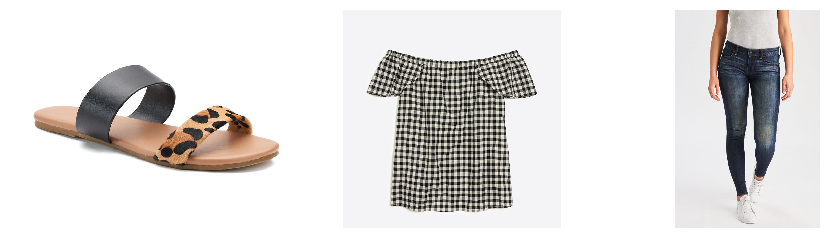

[[ 0.23560935  1.58997798  0.10656545 ...,  2.14606357  0.62596238
   1.05893242]]
Closest products: ['625555164', '618788026', '646000621', '524168032', '602281359', '642819749', '645014812', '651250446', '635784587', '643801377', '655473514', '623117334', '603805042', '646035414', '446631968']


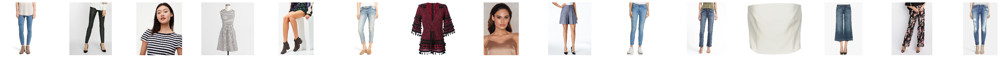

Input & Output Products: ['635920212', '635920206', '639439302']


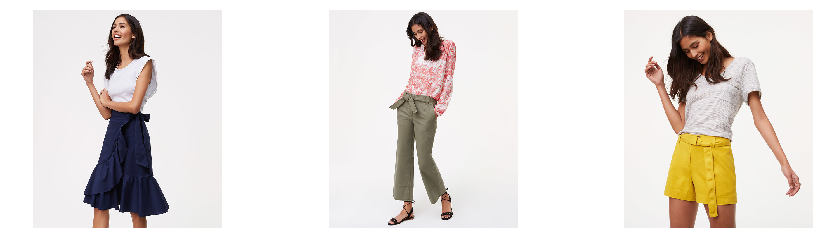

[[ 0.34795937  3.34573317  0.46945024 ...,  4.1793375   1.2656486
   2.19738984]]
Closest products: ['532049515', '639379043', '645316702', '512427023', '635126273', '631887505', '644804598', '641945025', '624463215', '651559856', '627804084', '647525026', '511353056', '628017949', '642771219']


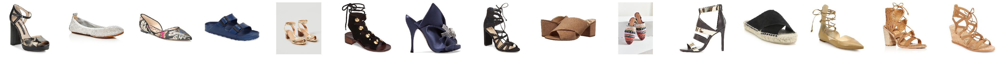

Input & Output Products: ['488003929', '620959414', '607186212']


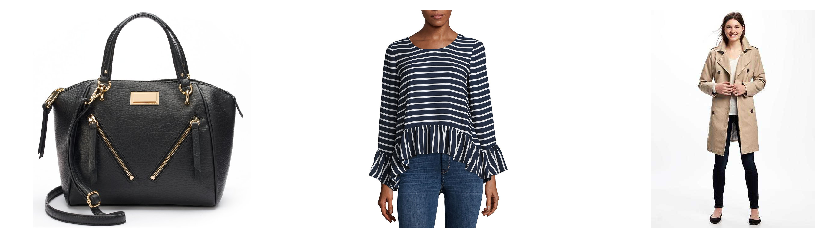

[[ 0.23264916  1.52495098  0.1271617  ...,  2.11553454  0.64237535
   1.0997963 ]]
Closest products: ['623117334', '618788026', '646000621', '638675298', '651250446', '625555164', '659840149', '608147516', '608212934', '539224830', '619083803', '524168032', '602281359', '606333663', '533542566']


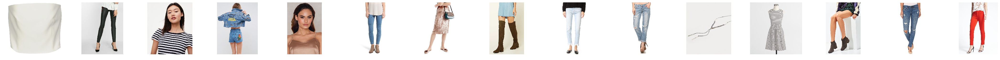

Input & Output Products: ['528995828', '494801318', '608796826']


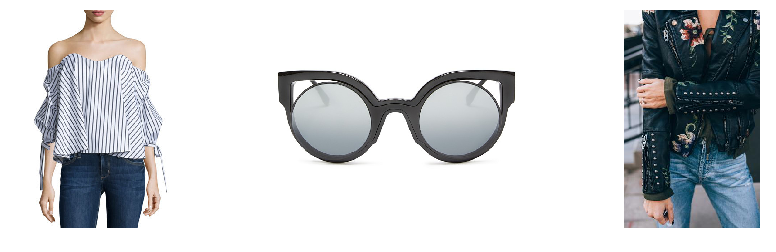

[[ 0.23329966  1.54625738  0.11210097 ...,  2.06213164  0.56087673
   1.02038014]]
Closest products: ['623117334', '638675298', '618788026', '651250446', '646000621', '608147516', '539224830', '659840149', '619083803', '625728380', '519045742', '512273017', '606333663', '624137043', '642164651']


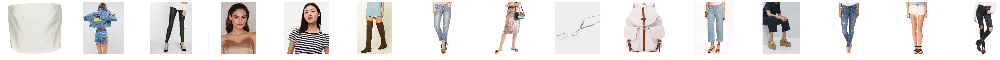

Input & Output Products: ['639532406', '537516964', '633390330']


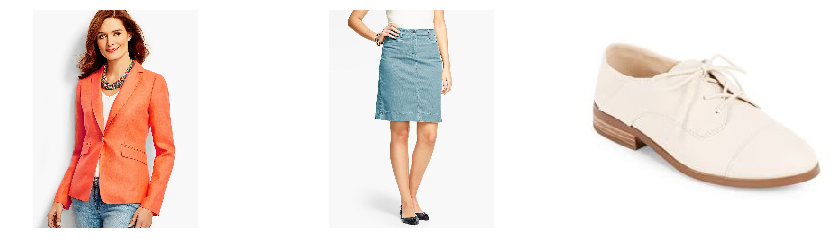

[[ 0.31350455  2.97022438  0.43010673 ...,  3.97366333  1.14919209
   2.14805937]]
Closest products: ['638557106', '625406311', '623947607', '609127110', '622209318', '635263532', '610564813', '542940649', '656002102', '536889970', '647556817', '656065504', '515660478', '642588609', '617235202']


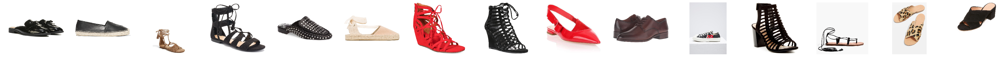

Input & Output Products: ['606330905', '623475516', '535182160']


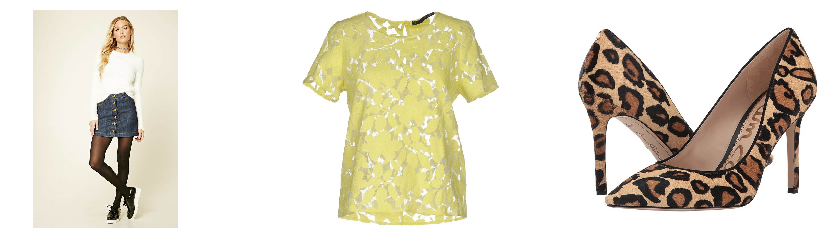

[[ 0.30924886  3.23114038  0.47237965 ...,  4.13714552  1.25050485
   2.200032  ]]
Closest products: ['639379043', '644804598', '631887505', '645316702', '532049515', '656584603', '635126273', '622209318', '623766438', '628017949', '625406311', '642771219', '657032610', '609127110', '639651985']


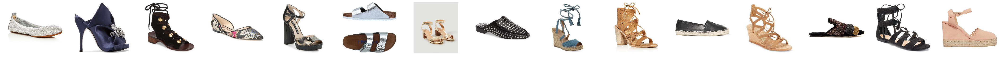

Input & Output Products: ['544636354', '629294687', '636949709']


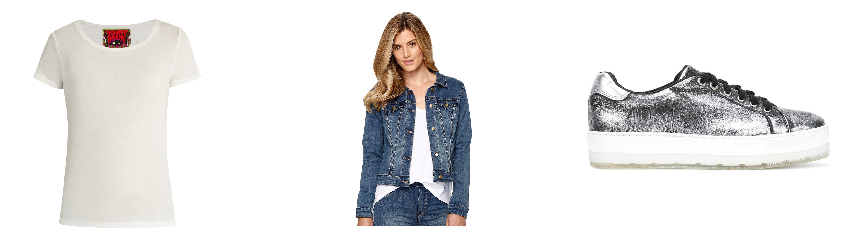

[[ 0.36165196  2.9168632   0.45018855 ...,  3.70040441  1.11311829
   1.93223441]]
Closest products: ['503388447', '635263532', '642154489', '623947607', '514443236', '616546963', '632143283', '616342396', '542940649', '607686312', '638557106', '637185063', '624459769', '626236624', '603106510']


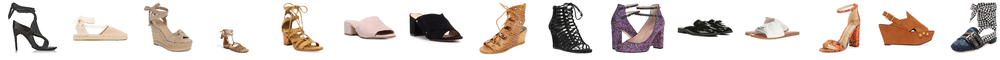

Input & Output Products: ['635126207', '635920212', '639043994']


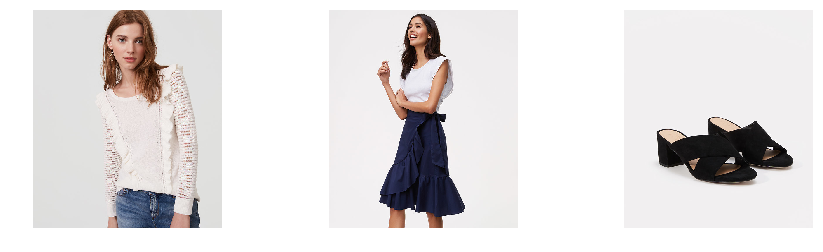

[[ 0.23932976  2.37276554  0.35964277 ...,  3.13401532  0.92083186
   1.62775242]]
Closest products: ['646593150', '643468977', '631221639', '477088343', '501295147', '629139203', '631540432', '519722686', '506662115', '634256662', '635443032', '625138861', '639532432', '635412903', '649778752']


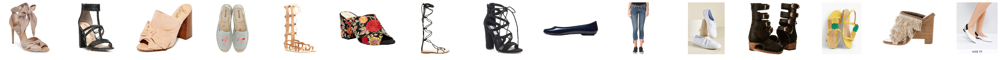

Input & Output Products: ['532120670', '533084159', '531597129']


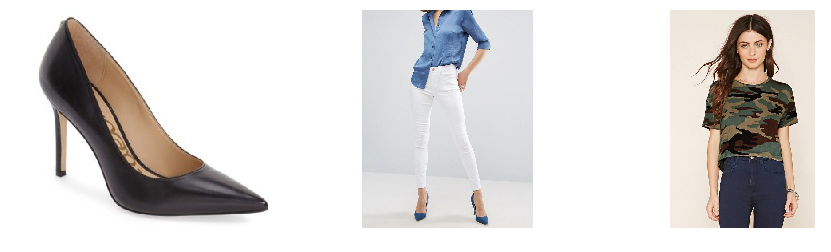

[[ 0.17307568  1.28075826  0.09159428 ...,  1.6815033   0.4847562
   0.88793898]]
Closest products: ['643553132', '610889300', '633871303', '520558601', '601669722', '640480007', '651461308', '535272202', '621329712', '620987514', '638454768', '653434295', '537430571', '608827155', '639840371']


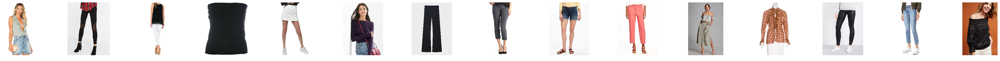

Input & Output Products: ['430237514', '607903213', '402041960']


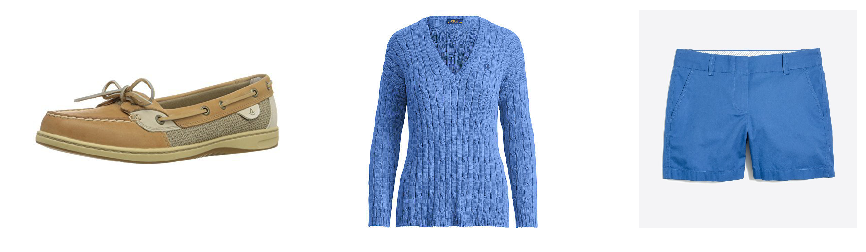

[[ 0.22422582  1.58678651  0.10782831 ...,  2.16401315  0.59301472
   1.09298027]]
Closest products: ['618788026', '646000621', '625555164', '651250446', '623117334', '524168032', '602281359', '659840149', '645014812', '643801377', '638675298', '608212934', '619083803', '635784587', '603805042']


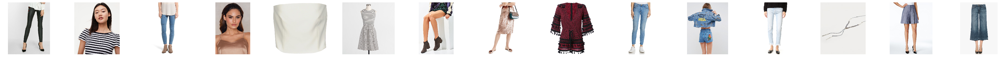

Input & Output Products: ['457532572', '623302392', '430981763']


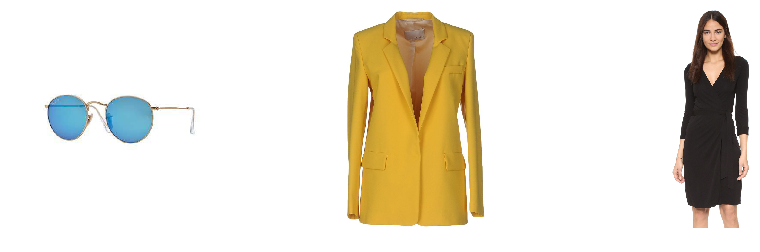

[[ 0.24058869  1.30259383  0.08448417 ...,  1.63068902  0.47696269
   0.8160941 ]]
Closest products: ['633871303', '610889300', '622627435', '621329712', '508585591', '527531134', '520558601', '643288367', '601669722', '608827155', '529549022', '610840671', '651632370', '643553132', '456480758']


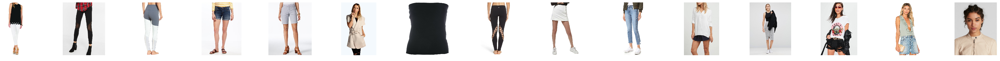

Input & Output Products: ['544696503', '602509196', '608569253']


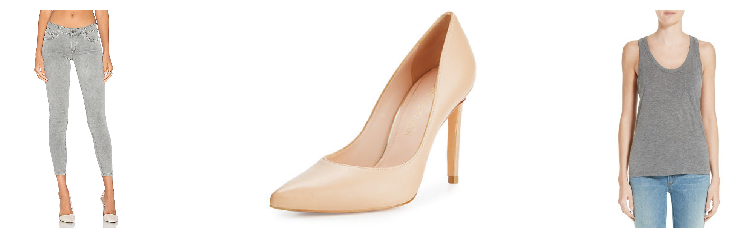

[[ 0.12036118  1.12677908  0.20410703 ...,  1.46566093  0.38414761
   0.77040601]]
Closest products: ['648341963', '613376563', '649806057', '651696913', '632592402', '632811378', '629918821', '622271213', '632089309', '539097394', '640693301', '638479815', '533053062', '628928830', '637985372']


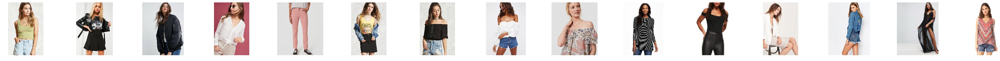

Input & Output Products: ['607419255', '533170360', '652018570']


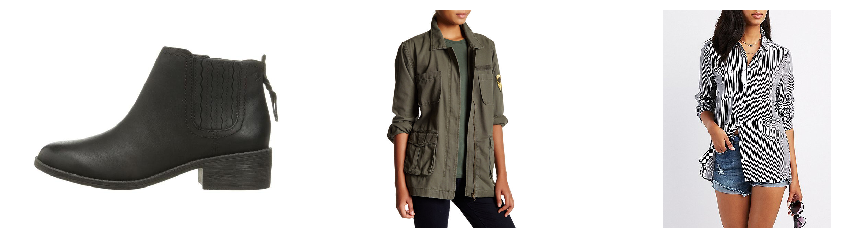

[[ 0.24781218  1.72100604  0.09432305 ...,  2.16906381  0.62876189
   1.13786042]]
Closest products: ['618788026', '625555164', '646000621', '623117334', '651250446', '524168032', '643801377', '608212934', '645014812', '602281359', '638675298', '659840149', '603805042', '513982895', '619083803']


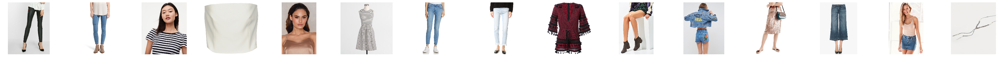

Input & Output Products: ['631545112', '628682770', '622556548']


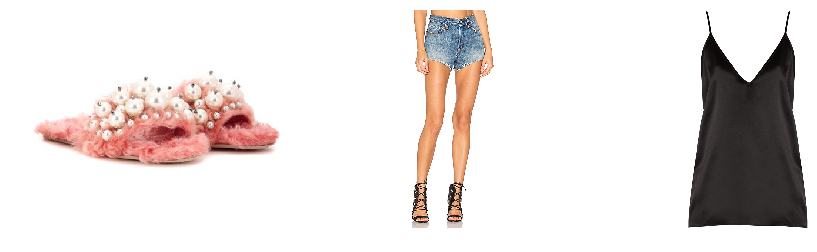

[[ 0.13365431  1.06999505  0.08790918 ...,  1.49935532  0.41429263
   0.78117585]]
Closest products: ['613376563', '648341963', '651696913', '632811378', '539097394', '638479815', '632089309', '621173819', '649806057', '655227231', '630379176', '538500580', '625640501', '626823537', '518425802']


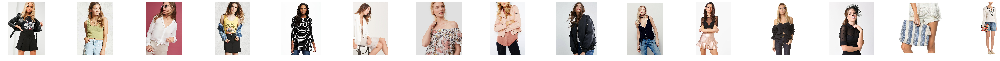

Input & Output Products: ['430603106', '656258872', '619978736']


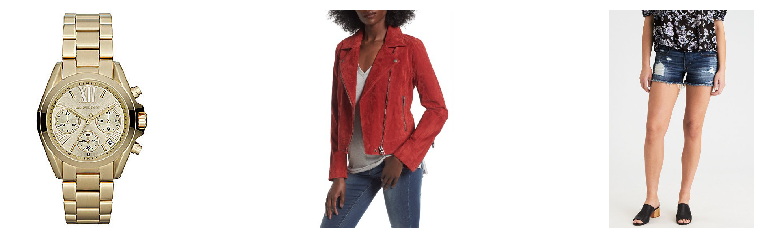

[[ 0.22826546  1.20245445  0.0646053  ...,  1.62118018  0.4868286
   0.8062821 ]]
Closest products: ['643553132', '651461308', '640480007', '537430571', '535272202', '613376563', '610889300', '633579276', '653434295', '621173819', '520558601', '620987514', '639464593', '601669722', '612777789']


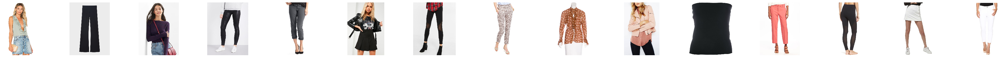

In [34]:
def get_closest_product_ids(input_features, model, index_to_prod_mapping):
    product_indexes = model.kneighbors(input_features, 15, return_distance=False)
    return [index_to_prod_mapping[index] for index in product_indexes[0]]

def test_predictions():
    test_file = 'data-outfits/outfit_permutations_small_sample.tsv'
    with open(test_file, 'r') as f:
        for i, line in enumerate(f.readlines()[:15]):
            l = line.split()
            product1_id = l[2]
            product2_id = l[5]
            product3_id = l[8]
            product_ids = [product1_id, product2_id, product3_id]
            merged_feat, y_feat = make_product_X_y(prods_to_feats, product1_id, product2_id, 
                                                   product3_id)
            
            clothing_skipgrams_model.predict(np.array([merged_feat_test]))
            
            print('Input & Output Products: {}'.format(product_ids))
            display_product_images(product_ids)
            prediction_vector = clothing_skipgrams_model.predict(np.array([merged_feat]))
            prediction_vector = prediction_vector[0]
            print(prediction_vector)
            closest_product_ids = get_closest_product_ids(prediction_vector, neighbors_model, index_to_prod)
            
            print('Closest products: {}'.format(closest_product_ids))
            display_product_images(closest_product_ids)
            
test_predictions()

In [ ]:
a = np.array([[1,2, 3]])
b = np.array([[4,5, 6]])
ab = np.concatenate((a, b, a), axis=1)

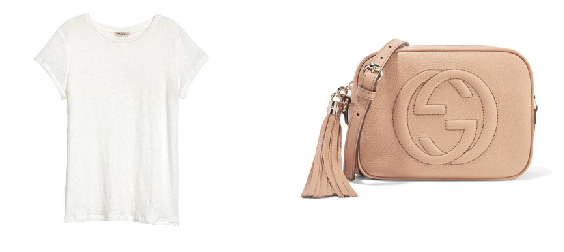

In [35]:
white_shirt_id = '633073622'
pink_bag_id = '645667402'
display_product_images([white_shirt_id, pink_bag_id])

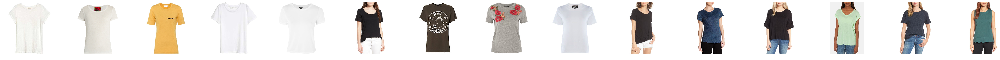

In [36]:
white_shirt_vector = prods_to_feats[white_shirt_id]
closest_white_shirt_ids = get_closest_product_ids(white_shirt_vector, neighbors_model, index_to_prod)
display_product_images(closest_white_shirt_ids)

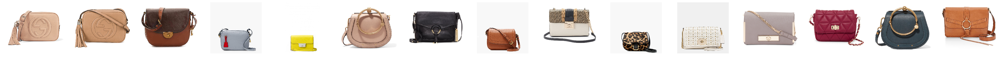

In [37]:
pink_bag_vector = prods_to_feats[pink_bag_id]
closest_pink_bag_ids = get_closest_product_ids(pink_bag_vector, neighbors_model, index_to_prod)
display_product_images(closest_pink_bag_ids)